## Import required packages

In [1]:
import time
import tempfile
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

from six import BytesIO
from six.moves.urllib.request import urlopen
from PIL import Image, ImageColor, ImageDraw, ImageFont, ImageOps

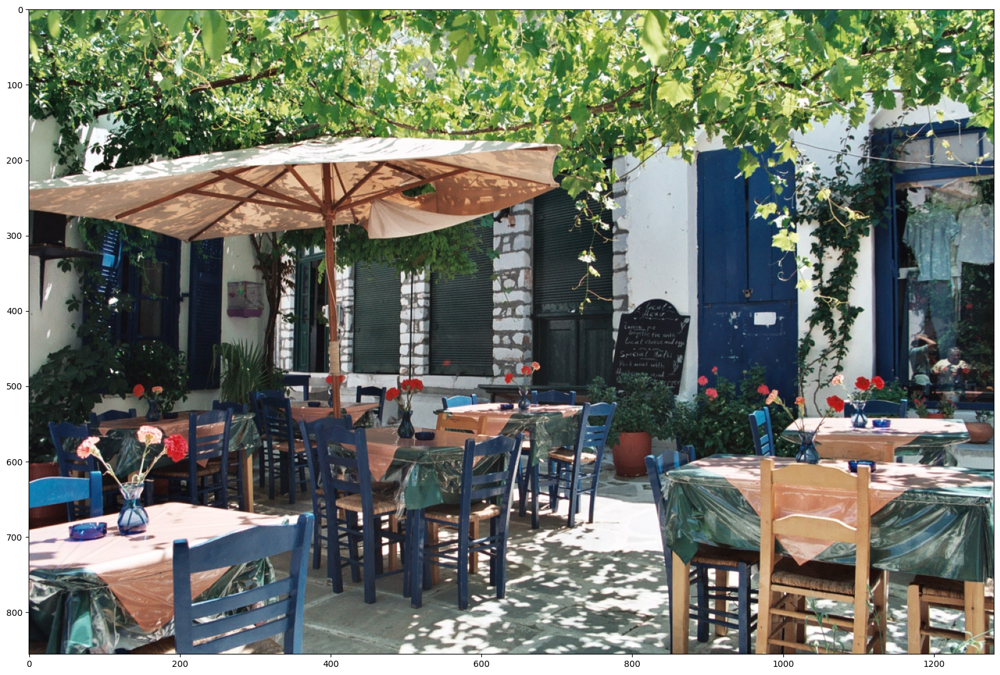

In [2]:
# Function to display an image using matplotlib
def display_image(image):
    # Create a new figure with a specific size
    fig = plt.figure(figsize=(20, 15))
    # Turn off the grid in the plot
    plt.grid(False)
    # Display the image
    plt.imshow(image)


# Function to download an image from a URL, resize it, and optionally display it
def download_and_resize_image(url, new_width=256, new_height=256, display=False):
    # Create a temporary file to store the downloaded image
    _, filename = tempfile.mkstemp(suffix=".jpg")
    # Open a connection to the URL and retrieve the image data
    response = urlopen(url)
    image_data = response.read()
    # Convert the image data into a BytesIO object
    image_data = BytesIO(image_data)
    # Open the image using PIL (Python Imaging Library)
    pil_image = Image.open(image_data)
    # Resize the image while maintaining aspect ratio using Lanczos resampling
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.LANCZOS)
    # Convert the image to RGB format
    pil_image_rgb = pil_image.convert("RGB")
    # Save the resized image to the temporary file as a JPEG with specified quality
    pil_image_rgb.save(filename, format="JPEG", quality=90)
    # If display flag is set, display the resized image
    if display:
        display_image(pil_image)
    # Return the path to the downloaded and resized image
    return filename


# URL of the image to download and resize
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"
# Download and resize the image, and display it
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

## Load the Model

Found 100 objects.
Inference time:  57.06623673439026


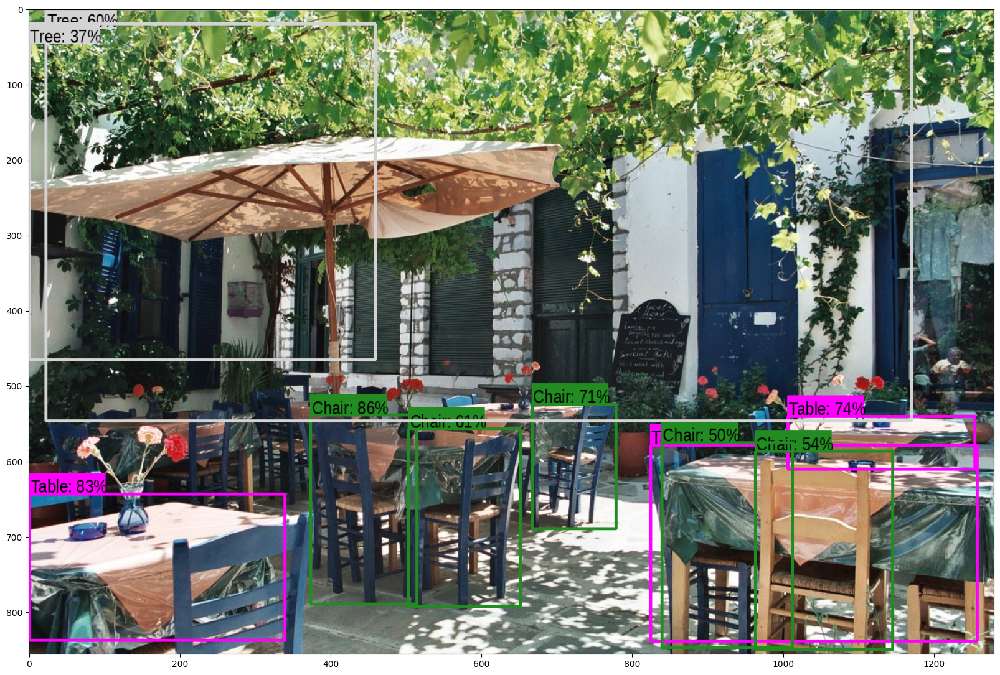

In [3]:
# Function to load an image from a file path using TensorFlow
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img


# Function to draw a bounding box on an image
def draw_bounding_box_on_image(
    image, ymin, xmin, ymax, xmax, color, font, thickness=4, display_str_list=()
):
    """Adds a bounding box to an image."""
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (
        xmin * im_width,
        xmax * im_width,
        ymin * im_height,
        ymax * im_height,
    )
    # Draw the bounding box
    draw.line(
        [(left, top), (left, bottom), (right, bottom), (right, top), (left, top)],
        width=thickness,
        fill=color,
    )

    # Calculate the total height of display strings
    display_str_heights = [font.getbbox(ds)[3] for ds in display_str_list]
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    # Determine where to place the text based on the bounding box position
    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height

    # Reverse list and print from bottom to top
    for display_str in display_str_list[::-1]:
        bbox = font.getbbox(display_str)
        text_width, text_height = bbox[2], bbox[3]
        margin = np.ceil(0.05 * text_height)
        draw.rectangle(
            [
                (left, text_bottom - text_height - 2 * margin),
                (left + text_width, text_bottom),
            ],
            fill=color,
        )
        draw.text(
            (left + margin, text_bottom - text_height - margin),
            display_str,
            fill="black",
            font=font,
        )
        text_bottom -= text_height - 2 * margin


# Function to draw boxes around detected objects on an image
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    """Overlay labeled boxes on an image with formatted scores and label names."""
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype(
            "/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf", 25
        )
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(
                class_names[i].decode("ascii"), int(100 * scores[i])
            )
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(
                image_pil,
                ymin,
                xmin,
                ymax,
                xmax,
                color,
                font,
                display_str_list=[display_str],
            )
            np.copyto(image, np.array(image_pil))
    return image


# Function to run object detection on an image using a given detector model
def run_detector(detector, path):
    img = load_img(path)

    converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    # Convert tensor outputs to numpy arrays
    result = {key: value.numpy() for key, value in result.items()}

    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time - start_time)

    image_with_boxes = draw_boxes(
        img.numpy(),
        result["detection_boxes"],
        result["detection_class_entities"],
        result["detection_scores"],
    )

    display_image(image_with_boxes)


# Load the detector model from TensorFlow Hub
module_handle = (
    "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
)
detector = hub.load(module_handle).signatures["default"]
run_detector(detector, downloaded_image_path)

## Model Prediction

Found 100 objects.
Inference time:  5.5756425857543945
Inference time: 5.723162651062012
Found 100 objects.
Inference time:  1.2162249088287354
Inference time: 1.3259947299957275
Found 100 objects.
Inference time:  1.2196931838989258
Inference time: 1.3612034320831299


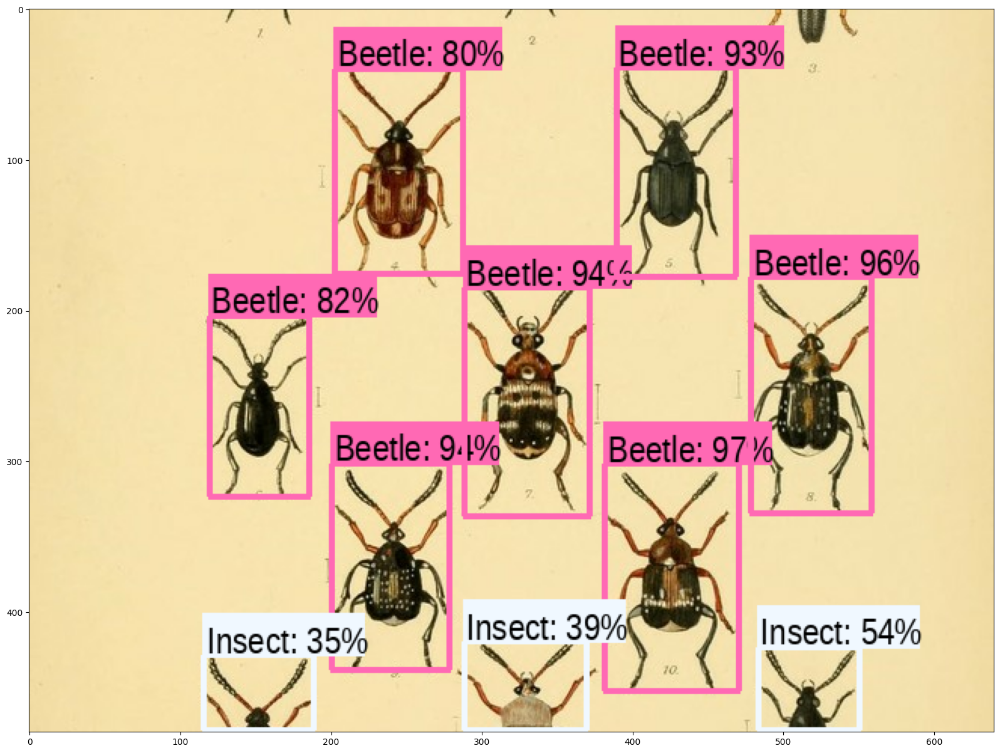

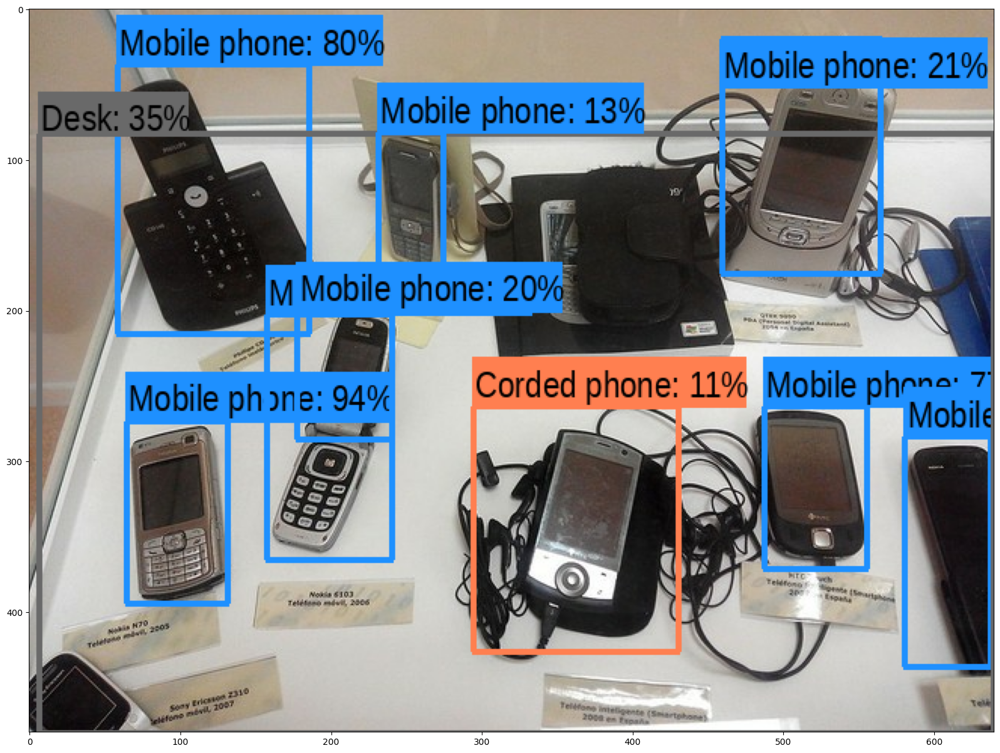

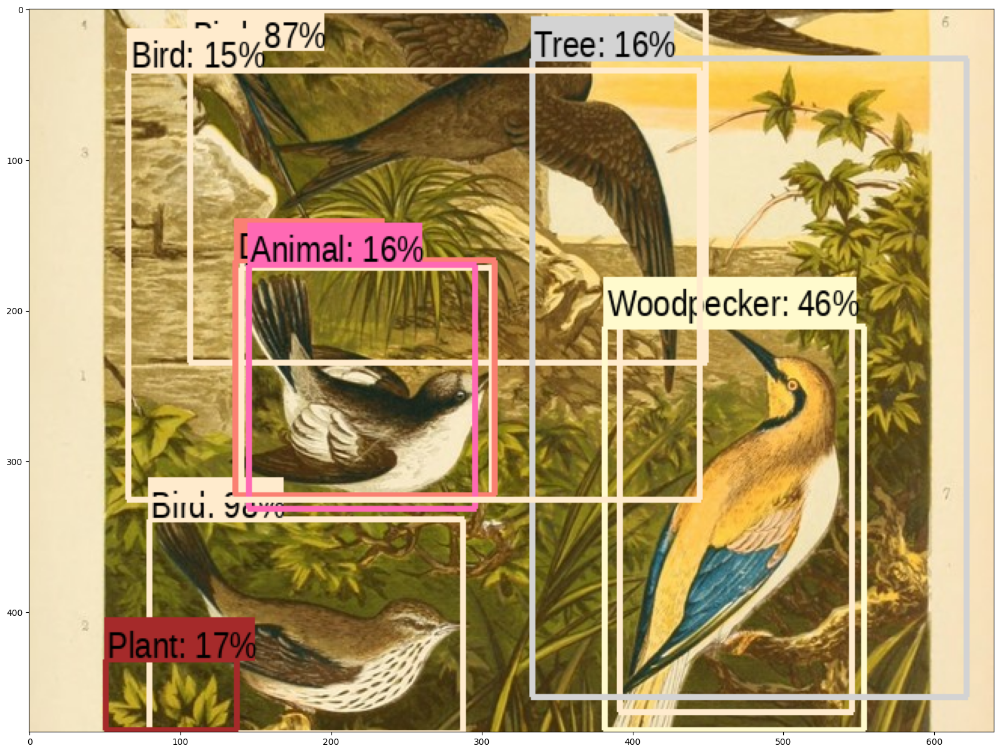

In [4]:
image_urls = [
    "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
]


# Function to detect objects in an image from a given URL
def detect_img(image_url):
    start_time = time.time()
    # Download and resize the image
    image_path = download_and_resize_image(image_url, 640, 480)
    # Run object detection on the image
    run_detector(detector, image_path)
    end_time = time.time()
    print("Inference time:", end_time - start_time)


# Loop through each image URL and detect objects
for url in image_urls:
    detect_img(url)

Found 100 objects.
Inference time:  1.2684907913208008
Inference time: 1.398003101348877


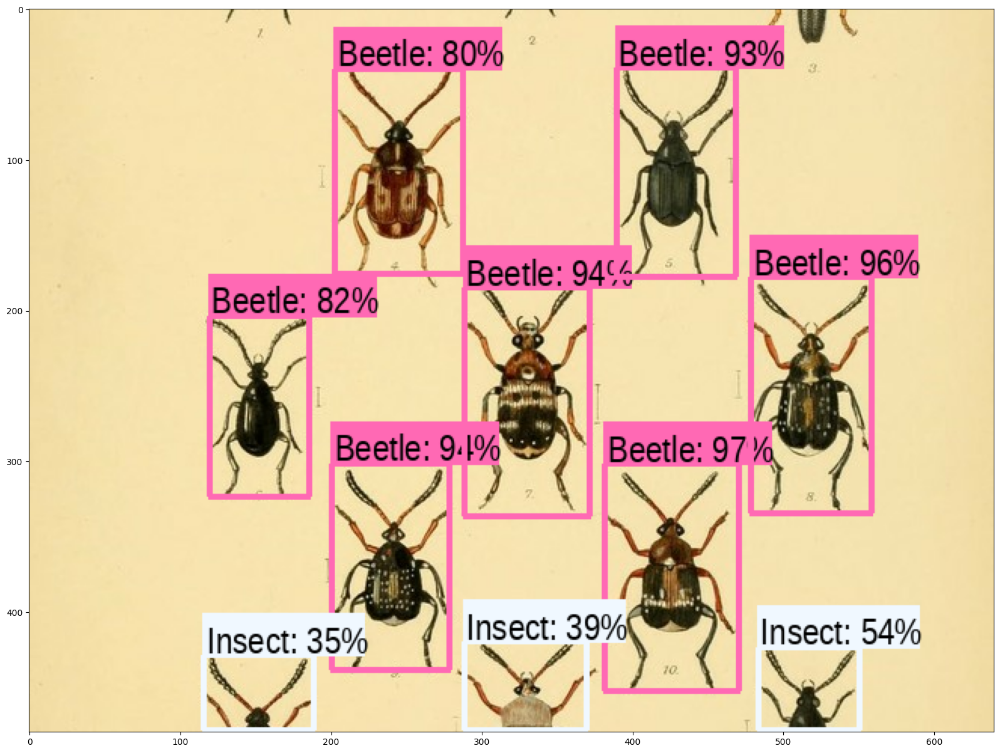

In [5]:
detect_img(image_urls[0])

Found 100 objects.
Inference time:  1.3934199810028076
Inference time: 1.5296356678009033


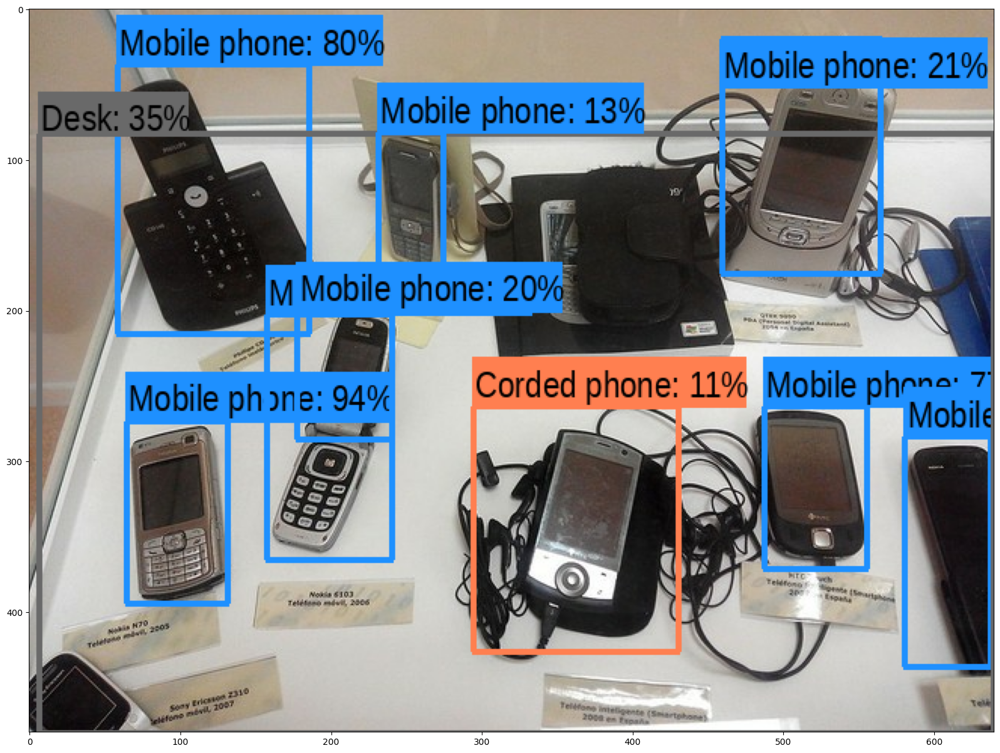

In [6]:
detect_img(image_urls[1])

Found 100 objects.
Inference time:  1.2361931800842285
Inference time: 1.4237422943115234


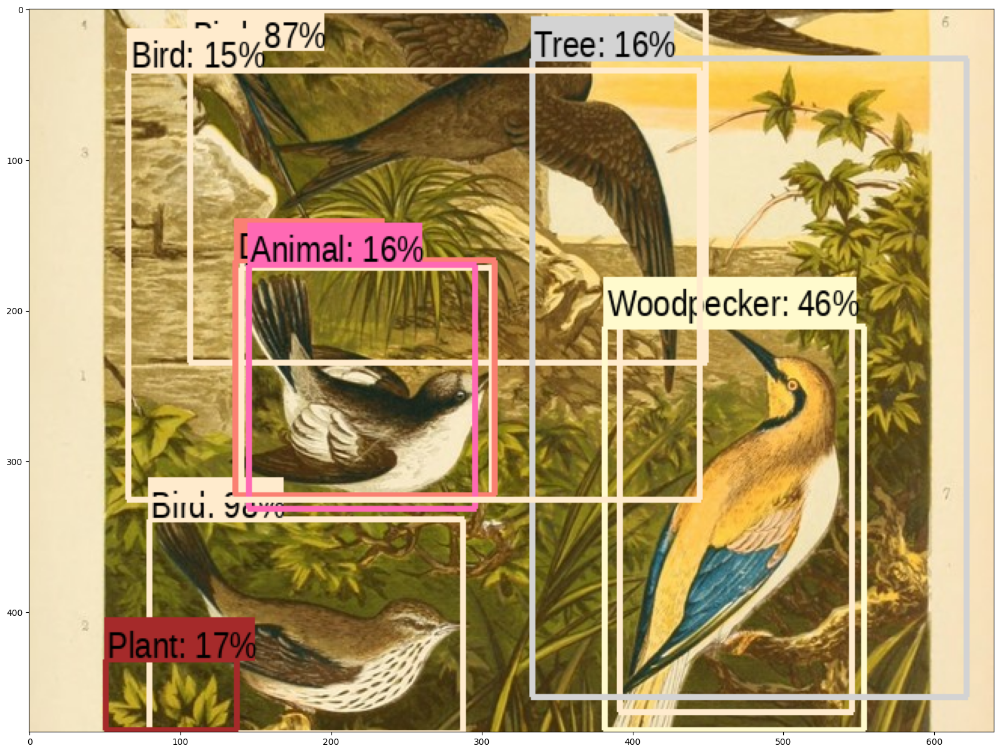

In [7]:
detect_img(image_urls[2])